# La transformada de Fourier

## Análisis temporal

Hasta ahora, hablando de audio, trabajamos con un solo tipo de representación, que es la de amplitud en función del tiempo. Por ejemplo, un tono puro de manera genérica se puede definir como:

$\displaystyle x(t) = A\cdot \sin (2\pi \cdot f \cdot  t)$

donde $A$ es la amplitud y $f$ es la frecuencia. Para representarlo y escucharlo, definamos que la amplitud es 2 y la frecuencia es $1000 Hz$.

$\displaystyle x_1(t) = 2\sin(2\pi\cdot 1000\cdot t )$

In [ ]:
import numpy as np

fs = 44100
t = np.arange(0,1,1/fs)
x_1 = 2*np.sin(2*np.pi*1000*t)

**Gráfico**

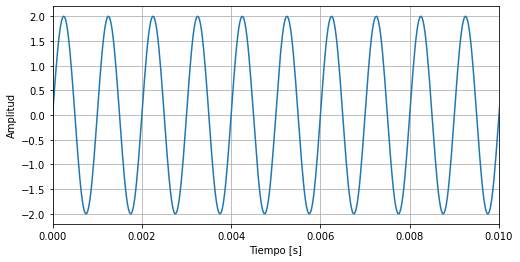

In [ ]:
import matplotlib.pyplot as plt

fig_1 = plt.figure(figsize = (8,4))
plt.plot(t,x_1)
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.grid()
plt.xlim(0,0.01)    # Zoom al gráfico
plt.show()

**Reproducción**

In [ ]:
from IPython.display import Audio, Image

Audio(x_1, rate = fs)

Si ahora sumamos otros dos tonos al tono $x_1(t)$ tal que:

$\displaystyle x_2(t) = -2\sin(2\pi\cdot 500\cdot t )$

$\displaystyle x_3(t) = 4\sin(2\pi\cdot 1200\cdot t )$

In [ ]:
x_2 = -2*np.sin(2*np.pi*500*t)
x_3 = 4*np.sin(2*np.pi*1200*t)

x_sum = x_1 + x_2 + x_3

**Gráfico**

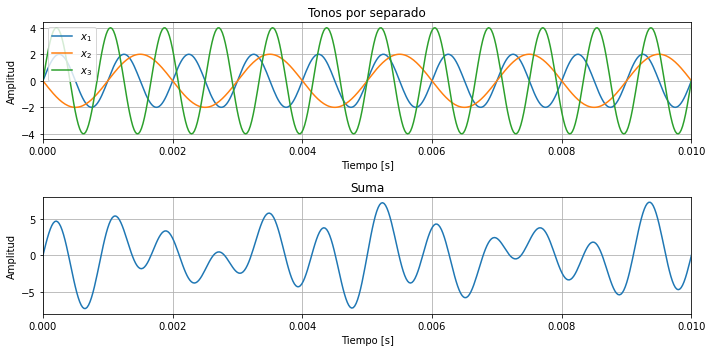

In [ ]:
fig_2 = plt.figure(figsize = (10,5))
plt.subplot2grid(shape = (2,1) , loc = (0,0))
plt.plot(t,x_1, label = r'$x_1$')
plt.plot(t,x_2, label = r'$x_2$')
plt.plot(t,x_3, label = r'$x_3$')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.title('Tonos por separado')
plt.grid()
plt.legend()
plt.xlim(0,0.01)    # Zoom al gráfico

plt.subplot2grid(shape=(2,1) , loc = (1,0))
plt.plot(t,x_sum)
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.title('Suma')
plt.grid()
plt.xlim(0,0.01)    # Zoom al gráfico

plt.tight_layout()
plt.show()

**Reproducción**

In [ ]:
Audio(x_sum , rate = fs)

## Análisis en frecuencia y transformada de Fourier

En el caso de tener una suma de tonos puros, ya la visualización no es tan clara, de hecho si tuviera unicamente la suma, sin saber de antemano de que se trata de la suma de 3 tonos, dificilmente pueda adivinar las frecuencias y amplitudes de cada uno. Para ello, es extremadamente útil el **análisis en frecuencia** de la misma.

Para ello, se aplica la **transformada de Fourier**, la cual se define como:

$ \displaystyle X(\omega) = \int \limits_{-\infty}^{\infty} x(t) \cdot e^{-i \omega  t} dt $


$ \displaystyle X(f) = \int \limits_{-\infty}^{\infty} x(t) \cdot e^{-i 2\pi f  t} dt $

y la anti-transformada de Fourier se define como:

$ \displaystyle x(t) = \frac{1}{2\pi}\cdot \int \limits_{-\infty}^{\infty} X(\omega) \cdot e^{i \omega  t} d\omega $

Las interpretaciones de la transformada de Fourier son muchas y las aplicaciones muchisimas mas. Una primera aproximación para entenderla, es que, la función resultante $X(f)$ depende únicamente de la frecuencia $f$ (mismo para $X(\omega)$) y no del tiempo. De este modo, este nuevo diagrama de amplitud en función de la frecuencia, que denominaremos **espectro**, nos muestra algo nuevo: ya no importa cómo varía la amplitud de la señal en función del tiempo, sino cuánta amplitud hay en cada frecuencia
que compone una señal.

Desde el punto de vista matemático, en realidad la transformada de Fourier es la proyección de mi señal $x(t)$ sobre una base ortonormal de senos de infinitas frecuencias. Es decir, compara frecuencia a frecuencia cuan parecida es mi señal con infinitos tonos puros de infinitas frecuencias ($ e^{-i 2\pi f  t} = \cos(2\pi f  t) + i\cdot \sin(2\pi f  t) $).

$ \displaystyle X(f) = < x(t) ~;~ e^{-i2 \pi ft}  >$

Al ser interpretado como una proyección, el espectro muestra como se distribuye la energía de la señal en cada frecuencia.


La primera aclaración que haremos, es que en realidad la computadora no calcula la transformada de Fourier con la expresión antes mencionada, si no que calcula la FFT (fast Fourier transform), la cual emula la DFT (discrete Fourier transform), pero a fines prácticos e introductorios, son casi iguales. Una diferencia importante es que $X(f)$ es una función continua, e implicitamente estaríamos diciendo que, para representarla, tenemos que incluir infinitas frecuencias, cosa que computacionalmente es imposible. Por eso es que en realidad digitalmente se opera con la DFT (hay diferencias mas sutiles entre transformada de Fourier, DFT y DTFT (discrete time Fourier transform) pero exceden al caracter introductorio de este documento), la cual tiene frecuencias finitas y discretas, con cierto espaciado entre ellas.

Mucho texto, vamos a graficar los espectros de los tonos y de la suma. 


**Transformada de Fourier:**

In [ ]:
freqs = np.fft.rfftfreq(len(x_1), 1/fs)

X_1 = np.fft.rfft(x_1)
spectre_1 = np.abs(X_1)

X_2 = np.fft.rfft(x_2)
spectre_2 = np.abs(X_2)

X_3 = np.fft.rfft(x_3)
spectre_3 = np.abs(X_3)

X_sum = np.fft.rfft(x_sum)
spectre_sum = np.abs(X_sum)

**Gráfico**

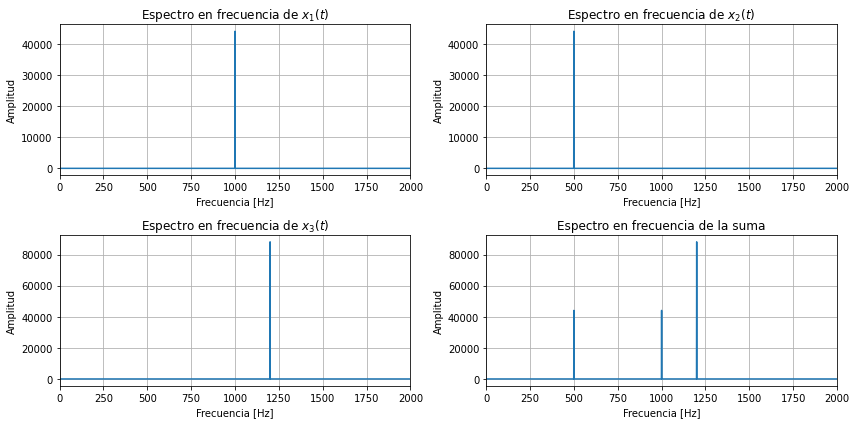

In [ ]:
fig_3 = plt.figure(figsize = (12,6))
plt.subplot2grid(shape = (2,2) , loc = (0,0))
plt.plot(freqs,spectre_1)
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.title(r'Espectro en frecuencia de $x_1(t)$')
plt.grid()
plt.xlim(0,2000)    # Zoom al gráfico

plt.subplot2grid(shape = (2,2) , loc = (0,1))
plt.plot(freqs,spectre_2)
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.title(r'Espectro en frecuencia de $x_2(t)$')
plt.grid()
plt.xlim(0,2000)    # Zoom al gráfico

plt.subplot2grid(shape = (2,2) , loc = (1,0))
plt.plot(freqs,spectre_3)
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.title(r'Espectro en frecuencia de $x_3(t)$')
plt.grid()
plt.xlim(0,2000)    # Zoom al gráfico

plt.subplot2grid(shape = (2,2) , loc = (1,1))
plt.plot(freqs,spectre_sum)
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.title('Espectro en frecuencia de la suma')
plt.grid()
plt.xlim(0,2000)    # Zoom al gráfico

plt.tight_layout()
plt.show()

Segunda aclaración importante: Con respecto a la amplitud, al estar calculando la DFT, la amplitud varía en función de la longitud de la señal, lo cual no tendría sentido aplicado a señales periódicas, es decir, si tengo un tono puro de frecuencia $500 Hz$, su energía no varía segun cuantos ciclos de la misma tome, su energía en $500 Hz$ debe ser la misma independientemente de la duración. Estas consideraciones son importantes saberlas pero no le daremos importancia aun, ya que requiere conocer en profundidad a la DFT y DTFT. Tambien se suele normalizar el espectro en frecuencia en función del máximo, es decir, dividir todo el vector resultante por el máximo, de forma tal que el pico de amplitud será 1 cuando $ X(f_i) = max(X(f)) $

## Transformada de Fourier en audios

Ahora analizemos muestras de audio y sus respuestas tanto en dominio temporal como frecuencial. Como ejemplo, utilizaremos tonos emitidos por un piano digital y por un sintetizador digital, ambos de la misma frecuencia.


In [ ]:
!git clone https://github.com/nahue-passano/clases_Python
!pip install soundfile

Cloning into 'clases_Python'...
remote: Enumerating objects: 10, done.
remote: Counting objects: 100% (10/10), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 10 (delta 0), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (10/10), done.


**Reproducción**

In [ ]:
Audio('clases_Python/Audios/tone_piano.wav')

In [ ]:
Audio('clases_Python/Audios/tone_synth.wav')

**Carga de tonos**

In [21]:
import soundfile as sf

tone_piano , fs_piano = sf.read('clases_Python/Audios/tone_piano.wav')
tone_piano = tone_piano[:,0]
len_piano = len(tone_piano)/fs_piano 
t_piano = np.arange(0 , len_piano , 1/fs_piano)

tone_synth , fs_synth = sf.read('clases_Python/Audios/tone_synth.wav')
tone_synth = tone_synth[:,0]
len_synth = len(tone_synth)/fs_synth
t_synth = np.arange(0 , len_synth , 1/fs_synth)

**Gráfico en tiempo**

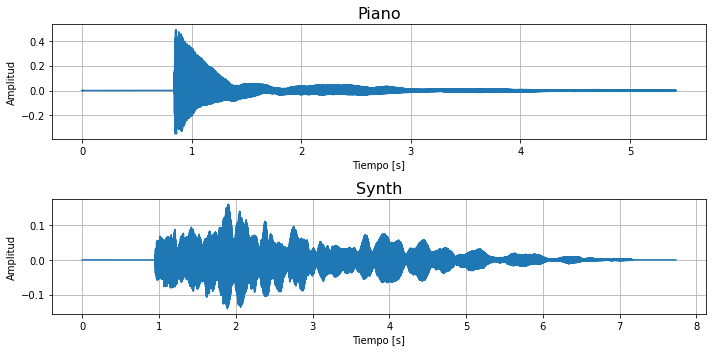

In [22]:
fig_4 = plt.figure(figsize = (10,5))
plt.subplot2grid(shape = (2,1) , loc = (0,0))
plt.plot(t_piano,tone_piano)
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.title('Piano', fontsize=16)
plt.grid()

plt.subplot2grid(shape = (2,1) , loc = (1,0))
plt.plot(t_synth,tone_synth)
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.title('Synth', fontsize=16)
plt.grid()

plt.tight_layout()
plt.show()

**Transformada de Fourier**

In [24]:
freq_piano = np.fft.rfftfreq(len(tone_piano), 1/fs_piano)
X_piano = np.fft.rfft(tone_piano)
spectre_piano = np.abs(X_piano)/np.max(np.abs(X_piano))

freq_synth = np.fft.rfftfreq(len(tone_synth), 1/fs_synth)
X_synth = np.fft.rfft(tone_synth)
spectre_synth = np.abs(X_synth)/np.max(np.abs(X_synth))

**Gráfico en frecuencia**

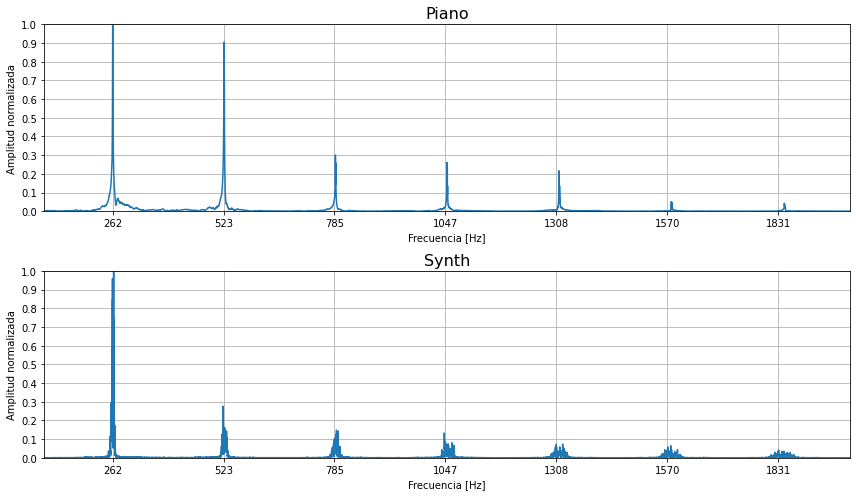

In [27]:
fig_5 = plt.figure(figsize = (12,7))
plt.subplot2grid(shape = (2,1) , loc = (0,0))
plt.plot(freq_piano,spectre_piano)
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud normalizada')
plt.title('Piano', fontsize=16)
plt.xticks(ticks = np.arange(1,8)*261.63)
plt.yticks(ticks = np.arange(0,11)*0.1)
plt.xlim(100,2000)    # Zoom al gráfico
plt.ylim(0,1)
plt.grid()

plt.subplot2grid(shape = (2,1) , loc = (1,0))
plt.plot(freq_synth,spectre_synth)
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud normalizada')
plt.title('Synth', fontsize=16)
plt.xticks(ticks = np.arange(1,8)*261.63)
plt.yticks(ticks = np.arange(0,11)*0.1)
plt.xlim(100,2000)    # Zoom al gráfico
plt.ylim(0,1)
plt.grid()

plt.tight_layout()
plt.show()

Bien, aca tenemos bastante para comentar. Primero que nada, ambos tonos tienen la misma frecuencia, que es un C4 (261.63 Hz), pero ¿Por que suenan distinto? Por el **timbre**. El timbre hace que podamos reconocer y discernir un piano de una guitarra o de cualquier otro instrumento sea cual sean las notas, y el mismo se manifiesta tanto en el diagrama de tiempo como de frecuencia.

En conjunto con el tono en 261.63 Hz, hay mas información en el espectro en frecuencia, lo cual se atribuye a los **armonicos**. Los mismos aparecen en multiplos de la frecuencia fundamental (261.63 Hz) y son los que justamente marcan el timbre de cada tono. La diferencia en porcentaje entre las amplitudes de los armonicos es el que hace que nosotros podamos identificar y clasificar sonidos segun su origen.

Si bien en dominio temporal en este caso la señales son bastante distintas, puede suceder que dos señales sean muy parecidas en dominio temporal y aun así sonar completamente distintas, y esto es culpa a la distribución de energía de la señal en sus armonicos. Por ejemplo comparemos el tono en el piano y el tono en un clavicordio (medio trucho pero es un clavicordio)

**Reproducción**

In [ ]:
Audio('clases_Python/Audios/tone_piano.wav')

In [ ]:
Audio('clases_Python/Audios/tone_clav.wav')

**Gráfico en tiempo**

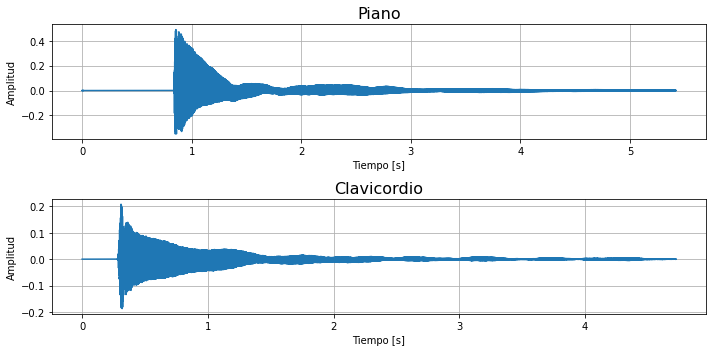

In [29]:
tone_clav , fs_clav = sf.read('clases_Python/Audios/tone_clav.wav')
tone_clav = tone_clav[:,0]
len_clav = len(tone_clav)/fs_clav
t_clav = np.arange(0 , len_clav , 1/fs_clav)[0:-1]

fig_6 = plt.figure(figsize = (10,5))
plt.subplot2grid(shape = (2,1) , loc = (0,0))
plt.plot(t_piano,tone_piano)
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.title('Piano', fontsize=16)
plt.grid()

plt.subplot2grid(shape = (2,1) , loc = (1,0))
plt.plot(t_clav,tone_clav)
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.title('Clavicordio', fontsize=16)
plt.grid()

plt.tight_layout()
plt.show()

**Gráfico en frecuencia**

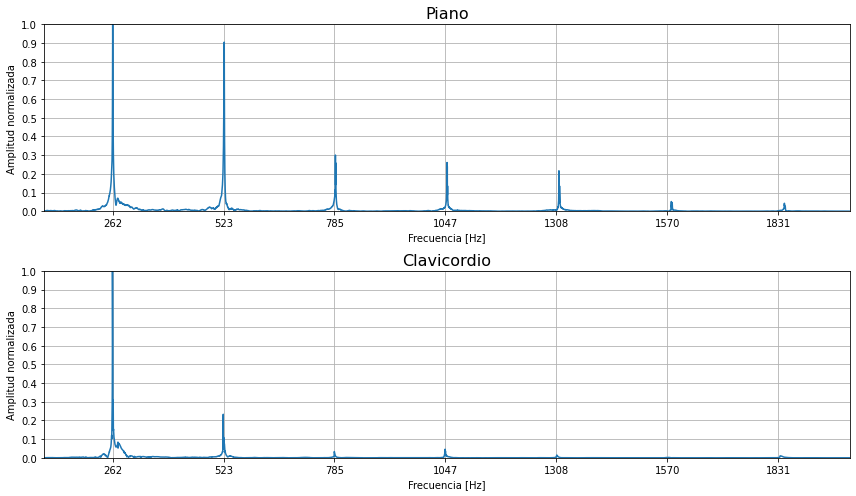

In [31]:
freq_clav = np.fft.rfftfreq(len(tone_clav), 1/fs_clav)
X_clav = np.fft.rfft(tone_clav)
spectre_clav = np.abs(X_clav)/np.max(np.abs(X_clav))

fig_7 = plt.figure(figsize = (12,7))
plt.subplot2grid(shape = (2,1) , loc = (0,0))
plt.plot(freq_piano,spectre_piano)
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud normalizada')
plt.title('Piano', fontsize=16)
plt.xticks(ticks = np.arange(1,8)*261.63)
plt.yticks(ticks = np.arange(0,11)*0.1)
plt.xlim(100,2000)    # Zoom al gráfico
plt.ylim(0,1)
plt.grid()

plt.subplot2grid(shape = (2,1) , loc = (1,0))
plt.plot(freq_clav,spectre_clav)
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud normalizada')
plt.title('Clavicordio', fontsize=16)
plt.xticks(ticks = np.arange(1,8)*261.63)
plt.yticks(ticks = np.arange(0,11)*0.1)
plt.xlim(100,2000)    # Zoom al gráfico
plt.ylim(0,1)
plt.grid()

plt.tight_layout()
plt.show()

En este caso, en dominio temporal las envolventes son bastante parecidas, pero en frecuencia ya cambia bastante la distribución energética. En el caso del piano se ve que el primer armónico (523 Hz) tiene un 90% de la energía que tiene la fundamental, cuando en el clavicordio tiene apenas un 25% aproximadamente. Ademas, en el clavicordio a partir del segundo armónico (785 Hz) ya no hay mucha energía apreciable, cuando en el piano recien en el quinto armónico (1570 Hz) hay poca energía considerable

## Espectrograma (STFT)

En la primera parte de este documento hablamos de la suma de varios tonos, pero otra forma de combinarlos o 'sumarlos' es concatenandolos, es decir, que la señal sea primero un tono, y al finalizar dicho tono comience el segundo tono y asi. Mejor veamosló de manera gráfica.

**Suma concatenada**

In [33]:
x_conc = np.concatenate((x_1,x_2,x_3))
t_conc = np.arange(0,3,1/fs)

**Gráfico en tiempo**

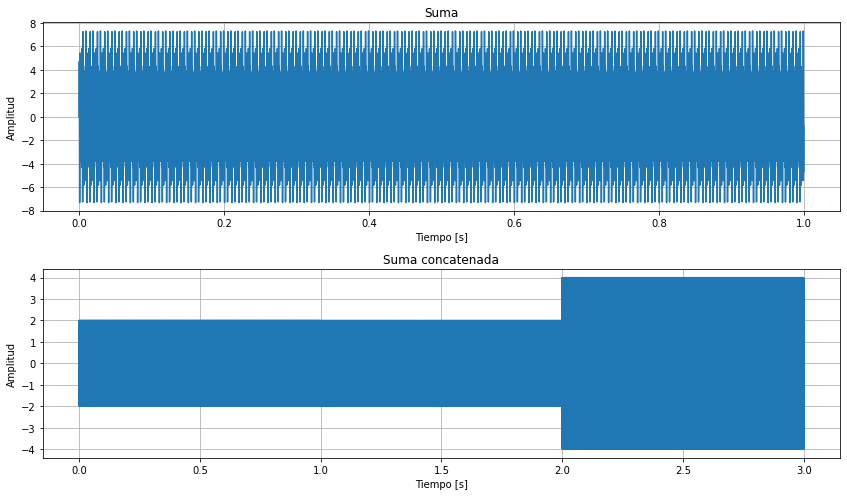

In [39]:
fig_8 = plt.figure(figsize = (12,7))
plt.subplot2grid(shape=(2,1) , loc = (0,0))
plt.plot(t,x_sum)
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.title('Suma')
plt.grid()
#plt.xlim(0,0.01)    # Zoom al gráfico

plt.subplot2grid(shape=(2,1) , loc = (1,0))
plt.plot(t_conc,x_conc)
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.title('Suma concatenada')
plt.grid()
#plt.xlim(1.99,2.01)    # Zoom al gráfico

plt.tight_layout()
plt.show()

Como se ve, son bastante distintas ambas señales en el dominio temporal, de hecho si las escuchamos tambien notaremos que son dos cosas distintas (una tiene los 3 tonos a la vez y la otra van de a uno).

In [ ]:
Audio(x_sum , rate = fs)

In [ ]:
Audio(x_conc, rate = fs)

Sin embargo, a pesar de que sean distintos tanto en duración como en sonoridad, el espectro en frecuencia de ambas señales **es el mismo** (mindblow). Esto sucede por las propiedades de la transformada de Fourier, al no tener dependencia temporal, la función $X(\omega)$ no tiene registro de cuando ocurrió cada tono, solo da información de como se distribuye la energía de la señal en función de la frecuencia, no del tiempo. Veamos esto en los gráficos de la transformada.

**Gráfico en frecuencia**

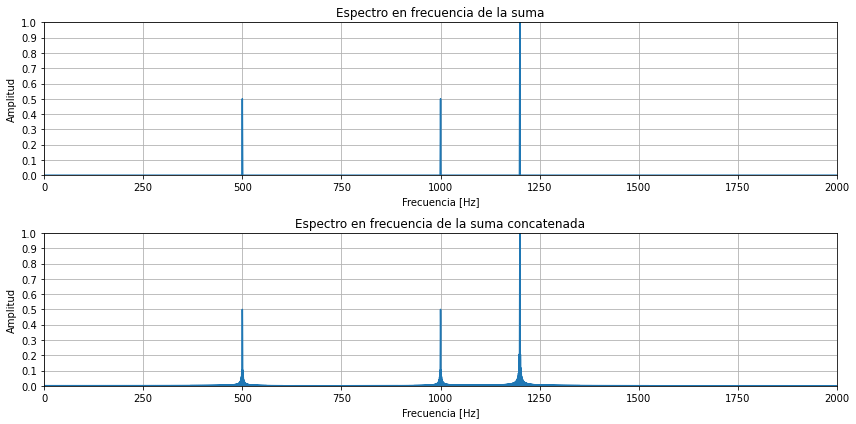

In [40]:
freq_conc = np.fft.rfftfreq(len(x_conc), 1/fs)
X_conc = np.fft.rfft(x_conc)
spectre_conc = np.abs(X_conc)/np.max(np.abs(X_conc))

fig_9 = plt.figure(figsize = (12,6))
plt.subplot2grid(shape = (2,1) , loc = (0,0))
plt.plot(freqs,spectre_sum/np.max(spectre_sum))
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.title('Espectro en frecuencia de la suma')
plt.grid()
plt.xlim(0,2000)    # Zoom al gráfico
plt.yticks(ticks = np.arange(0,11)*0.1)
plt.ylim(0,1)

plt.subplot2grid(shape = (2,1) , loc = (1,0))
plt.plot(freq_conc,spectre_conc/np.max(spectre_conc))
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.title('Espectro en frecuencia de la suma concatenada')
plt.grid()
plt.xlim(0,2000)    # Zoom al gráfico
plt.yticks(ticks = np.arange(0,11)*0.1)
plt.ylim(0,1)

plt.tight_layout()
plt.show()

El espectro normalizado de ambas señales es el mismo, pero hay una leve diferencia. En el espectro de la suma concatenada hay información en frecuencias cercanas a las frecuencias de los tonos, esto se debe a un fenomeno llamado *Spectral Leakage*. De manera muy resumida, recordando que la transformada es la proyección de una señal sobre una base ortonormal de cosenos y senos ($e^{-i\omega t}$), y ademas cuando trabajamos en el mundo digital en realidad utilizamos la FFT que emula la DFT, por lo cual la base ortonormal tendrá finitos elementos, con frecuencias finitas. El *Spectral Leakage* sucede cuando la frecuencia de la señal que estoy proyectando **no está** dentro de las frecuencias contenidas por la base ortonormal, entonces la señal se proyecta en las frecuencias cercanas que **si** estan contenidas. 

Retomemos con lo anterior, una manera de diferenciar ambas señales en el dominio frecuencial, es introduciendo la variable temporal en un diagrama de 3 dimensiones, donde podremos localizar puntualmente que frecuencia se emitio en que intervalo de tiempo. Esto es posible gracias a **transformada corta de Fourier** (STFT = short time Fourier transform), de la cual podremos graficar el **espectrograma** de la señal.

La definición es un tanto complicada ya que involucra el ventaneo de la señal (tomar una cierta cantidad de muestras de la señal) pero de manera muy resumida e introductoria, lo que hace la STFT es calcular la transformada de Fourier tomando pequeños tramos de la señal, entonces el diagrama del que hablamos, rejunta todas las transformadas de cada tramo de señal, otorgando así una referencia temporal.

In [42]:
Image('clases_Python/STFT.png', width=600, height=600)

Mucho texto (x2). Vamos a los gráficos.

**Espectrograma**

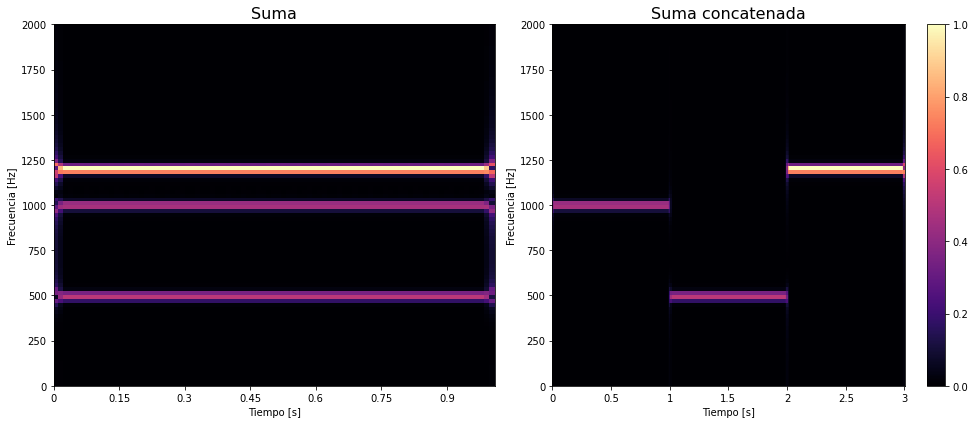

In [45]:
import librosa.display

M = 2048     # Tamaño de la ventana
hop = 512    # Tamaño del salto
# La relación entre M y hop la da el criterio de COLA

stft_x_sum = librosa.core.stft(x_sum,hop_length = hop,n_fft = M)
spectogram_x_sum = np.abs(stft_x_sum)/np.max(np.abs(stft_x_sum))

stft_x_conc = librosa.core.stft(x_conc,hop_length=hop,n_fft=M)
spectogram_x_conc = np.abs(stft_x_conc)/np.max(np.abs(stft_x_conc))

fig_10 = plt.figure(figsize = (14,6))
plt.subplot2grid(shape = (1,2) , loc = (0,0))
librosa.display.specshow(spectogram_x_sum , sr=fs , hop_length=hop , y_axis="linear", x_axis="time")
plt.title('Suma', fontsize=16)
plt.xlabel("Tiempo [s]")
plt.ylabel("Frecuencia [Hz]")
plt.ylim(0,2000)

plt.subplot2grid(shape = (1,2) , loc = (0,1))
librosa.display.specshow(spectogram_x_conc , sr = fs , hop_length=hop , y_axis="linear", x_axis="time")
plt.title('Suma concatenada', fontsize=16)
plt.xlabel("Tiempo [s]")
plt.ylabel("Frecuencia [Hz]")
plt.ylim(0,2000)
plt.colorbar()

plt.tight_layout()
plt.show()

Vamos a analizar lo mismo pero ahora con un segmento musical. En este caso usaremos un audio donde se toca la escala mayor de Do con un piano. Primero vamos a escucharlo y luego comparemos el resultado del espectro en frecuencia y del espectrograma (el gráfico en dominio temporal no tiene mucho sentido).

**Reproducción**

In [ ]:
Audio('clases_Python/Audios/scale_c.wav')

**Comparación entre el espectro en frecuencia y el espectrograma**

Cálculos

In [47]:
# Carga del audio
scale , fs_scale = sf.read('clases_Python/Audios/scale_c.wav')
scale = scale[:,0]

# Espectro en frecuencia
freq_scale = np.fft.rfftfreq(len(scale), 1/fs_scale)
X_scale = np.fft.rfft(scale)
spectre_scale = np.abs(X_scale)/np.max(np.abs(X_scale))

# Espectrograma
M = 2048     #Tamaño de la ventana
hop = 256    #Tamaño del salto
stft_scale = librosa.core.stft(scale,hop_length=hop,n_fft=M)
spectogram_scale = np.abs(stft_scale)/np.max(np.abs(stft_scale))

Gráfico

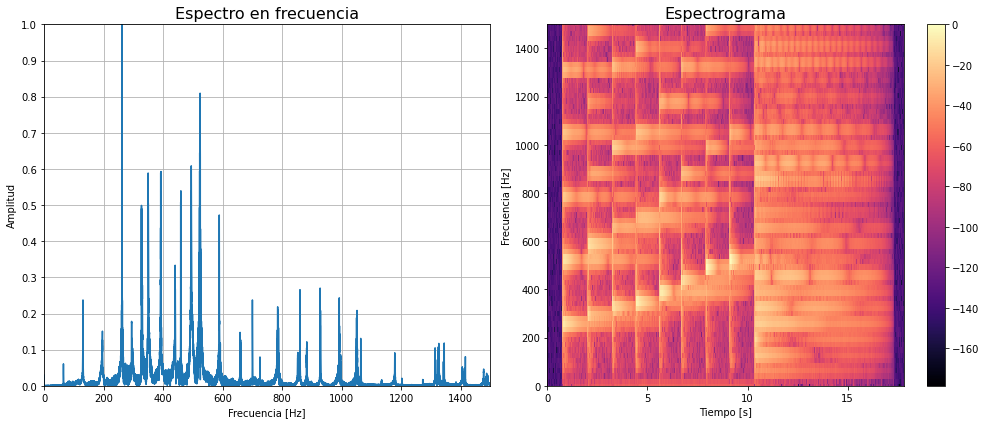

In [48]:
fig_11 = plt.figure(figsize = (14,6))
plt.subplot2grid(shape = (1,2) , loc = (0,0))
plt.plot(freq_scale,spectre_scale)
plt.title('Espectro en frecuencia', fontsize = 16)
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.yticks(ticks = np.arange(0,11)*0.1)
plt.xlim(0,1500)    # Zoom al gráfico
plt.ylim(0,1)
plt.grid()

plt.subplot2grid(shape = (1,2) , loc = (0,1))
librosa.display.specshow(20*np.log10(spectogram_scale) , sr=fs_scale , hop_length=hop , y_axis="linear", x_axis="time")
plt.title('Espectrograma', fontsize = 16)
plt.xlabel("Tiempo [s]")
plt.ylabel("Frecuencia [Hz]")
plt.ylim(0,1500)
plt.colorbar()

plt.tight_layout()
plt.show()

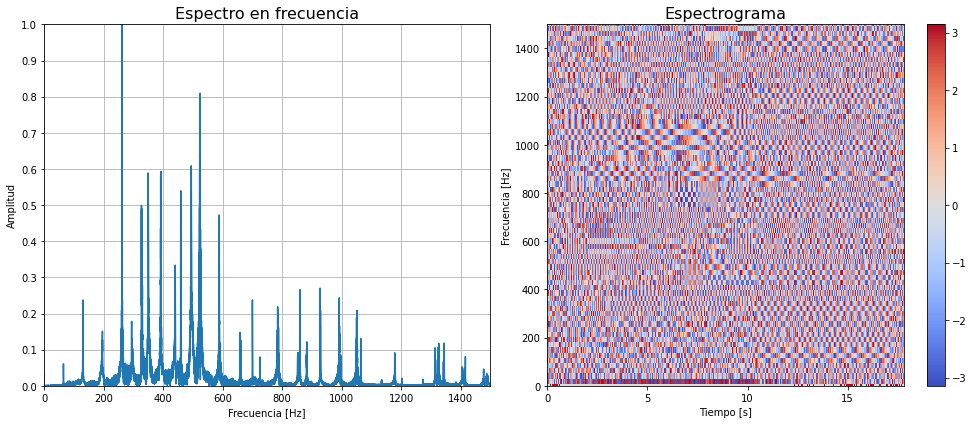

In [49]:
fig_11 = plt.figure(figsize = (14,6))
plt.subplot2grid(shape = (1,2) , loc = (0,0))
plt.plot(freq_scale,spectre_scale)
plt.title('Espectro en frecuencia', fontsize = 16)
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.yticks(ticks = np.arange(0,11)*0.1)
plt.xlim(0,1500)    # Zoom al gráfico
plt.ylim(0,1)
plt.grid()

plt.subplot2grid(shape = (1,2) , loc = (0,1))
librosa.display.specshow(np.angle(stft_scale) , sr=fs_scale , hop_length=hop , y_axis="linear", x_axis="time")
plt.title('Espectrograma', fontsize = 16)
plt.xlabel("Tiempo [s]")
plt.ylabel("Frecuencia [Hz]")
plt.ylim(0,1500)
plt.colorbar()

plt.tight_layout()
plt.show()